# Project Presentation
---

## Introduction
### <span style="color:darkblue">Background</span>  
Earth’s ocean circulation is a complex system that is driven by large-scale surface wind patterns and internal density variations. Commonly, sophisticated mathematical models are used to simulate ocean circulation based on geophysical fluid dynamic theories. In this project, I aimed to build a set of functions to solve geophysics-related partial differential equations (PDEs) that are usually associated with climate models.

### <span style="color:darkblue">Objective</span>
The project aims to use the **pseudo-spectral method** to solve any **one-dimensional first-order PDE** (with periodic boundary condition). One example would be the **Advection-Diffusion equation**:

<font size= "3">$$\frac{\partial u}{\partial t} = D\frac{\partial^2 u}{\partial x^2} - v\frac{\partial u}{\partial x}$$</font>

where $u(x,t)$ is the signal/wave being transported, $t$ is time, $x$ is the spatial domain, $D$ is the diffusion coefficient, and $v$ is the velocity of the flow.  
In this project, I have created a package for solving these PDEs: `PDEsolver`.  
Firstly, import all necessary modules:

In [1]:
import numpy as np
from scipy import integrate
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from matplotlib import cm

----
## What is the Pseudo-spectral Method?
### <span style="color:darkblue">Definition</span>
- a numerical method for solving PDEs in Applied Mathematics and Scientific Computing. Here, we use it to solve *derivatives* in PDEs.  
- In the pseudo-spectral method, we represent the solution of the PDE as a sum of basis functions, such as Fourier or Chebyshev polynomials
- These basis functions allow us to accurately capture the behavior of the PDE by representing it as a combination of simpler functions

### <span style="color:darkblue">Question:  We have a function $f(x)$, find the derivative of it</span>
- We can calculate the derivative mannually by remembering the formula of $f'(x)$
- We can use finite-difference methods to calculate $f'(x)$ numerically
**Flaws?**
- Hard to implement formula one-by-one when we have large amount of calculations
- Difficult choices of method selection as the resolution-error trade-off

### <span style="color:darkblue">Let's see how the pseudo-spectral method finds *derivatives*</span>
1. Transform $f(x)$ in to the **Fourier Basis** 
<font size= "3">$$ f(x)  \to \hat{f}(\kappa)$$</font>
2. According to **Inverse Fourier Transform formula**
<font size= "3">$$f(x) = \int_{-\infty}^{+\infty}\hat{f}(\kappa)e^{i\kappa x} \, dx $$</font>
3. Calculate derivative in the **Fourier Basis**
<font size= "3">$$\frac{df}{dx} = \int_{-\infty}^{+\infty}i\kappa\hat{f}(\kappa)e^{i\kappa x} \, dx $$</font>

That is, $f'(x)$ is the inverse fourier transform of $i\kappa\hat{f}(\kappa)$. 

In terms of Python code, it becomes:
```python
def derivative(grid, f, order):
    '''
    This is the function for finding the derivative of a function f with domain x, using the pseudo-spectral method. 
    The function f is being transformed to the Fourier basis and then calculate the derivative by multiplying i*wave number.
    The order of derivative can be defined at the beginning as an input.
    The output is the given order derivative in the physical domain.
    '''
    κ = grid.wavenum                          # wavenumber domain for the function f
    fhat = np.fft.fft(f)                      # Fourier tranform of f
    d_ord_fhat = (1j*κ)**order*fhat           # the 'order'th derivative of fhat 
    d_ord_f = np.fft.ifft(d_ord_fhat).real    # the 'order'th derivative of f
      
    return d_ord_f
```
Then, we can write PDEs into Ordinary Differential Equations (ODEs), and then use `scipy.integrate.solve_ivp()` to solve ODEs. 

In [2]:
# ?integrate.solve_ivp

The advection-diffusion equation ($\frac{\partial u}{\partial t} = D\frac{\partial^2 u}{\partial x^2} - v\frac{\partial u}{\partial x}$) can be simplified into an ODE:
```python
def adv_diff_eq(t,u,grid,D,v):
    '''
    This function is for deriving the advection diffusion equation with RHS fully solved.
    This function will be implemented in the below integration function.
    t is the temporal domain, which should take the form t = time_domain(tmax,dt).
    grid is the grid of spatial domain, containing the physical domain and fourier domain.
    D is the diffusion coefficient.
    v is the advection velocity.
    '''
    d_u = derivative(grid,u,1)
    dd_u = derivative(grid,u,2)
    
    du_dt = D*dd_u - v*d_u
    return du_dt
```

----
## The `PDEsolver` Package

In [3]:
import PDEsolver as pde

In [4]:
?pde

Type:        module
String form: <module 'PDEsolver' from '/home/jupyter-u7061118/EMSC-4033/Notebooks/u7061118_assessment/PDEsolver.py'>
File:        ~/EMSC-4033/Notebooks/u7061118_assessment/PDEsolver.py
Docstring:  
This module is designed to solve any one-dimensional first-order Partial Differential Equations (PDEs). This package uses the pseudo-spectral method to solve PDEs, based on the Fourier basis. Functions in this module include:

time_domain(tmax,dt)
create_grid(length,num_of_points)
derivative(grid,f,order)
adv_diff_eq(u,t,grid,D,v)
burger_eq(u,t,grid,D,v)
plot_anim(t,grid,u0,u)


In [5]:
?pde.create_grid

Init signature: pde.create_grid(length, num_of_points)
Docstring:     
This is a class that creates the spatial grid of the PDE.
This class will store two numpy arrays: the physical grid `x` and the Fourier grid `wavenumber`. 
The two grids will be calculated once the class is called, and there will be no repeated calculation in later computations.
File:           ~/EMSC-4033/Notebooks/u7061118_assessment/PDEsolver.py
Type:           type
Subclasses:     


---
## Solve the Advection-Diffusion Equation $\frac{\partial u}{\partial t} = D\frac{\partial^2 u}{\partial x^2} - v\frac{\partial u}{\partial x}$  


### <span style="color:darkblue">Advection Only</span>
Find the **Gaussian function** <font size= "5">$$u = \frac{\sigma}{\sqrt{\sigma^2+2Dt}}e^{-\frac{x^2}{2(\sigma^2+2Dt)}}$$</font> after 10 seconds for $x \in [-5\pi,5\pi]$ and $\sigma = 0.8$ when the wave is simply advecting at velocity equals to 0.5.

In [6]:
# Define Parameters
grid_gauss = pde.create_grid(10*np.pi,512)  # Spatial domain
x_gauss = grid_gauss.x
t_gauss = pde.time_domain(10,0.1)           # Time domain

v_ao = 0.5                               # Advection velocity
D_ao = 0.0                               # No diffusion

# Initial condition, σ is the width of the Gaussian curve initially
def gaussian_solution(t, x, σ, D):
    return σ / np.sqrt(σ**2 + 2*D*t) * np.exp(-x**2 / (2*(σ**2 + 2*D*t)))

u0_gauss = gaussian_solution(0,x_gauss,0.8,0)

In [7]:
# Calculate the solution
numerical_sol_ao  = integrate.solve_ivp(pde.adv_diff_eq,[t_gauss[0],t_gauss[-1]],u0_gauss,args=(grid_gauss,D_ao,v_ao),t_eval=t_gauss,method='DOP853')
pde.plot_anim(t_gauss,grid_gauss,u0_gauss,numerical_sol_ao)

### <span style="color:darkblue">Diffusion Only</span>
For the same Gaussian function, find the signal after 10 seconds for $x \in [-5\pi,5\pi]$ and $\sigma = 0.8$ when the wave is simply diffusing at rate equals to 0.5.

In [8]:
# Define parameters
v_do = 0.0                               # No advection
D_do = 0.5                               # Diffusion rate

In [9]:
# Calculate the solution
numerical_sol_do  = integrate.solve_ivp(pde.adv_diff_eq,[t_gauss[0],t_gauss[-1]],u0_gauss,args=(grid_gauss,D_do,v_do),t_eval=t_gauss,method='DOP853')
pde.plot_anim(t_gauss,grid_gauss,u0_gauss,numerical_sol_do)

### <span style="color:darkblue">Looks right? We need to check them $\to$ Analytical Solutions</span>
For advection, when initial condition is $u_0(x)$, then the solution is: $$u(x,t) = u_0(x - vt)$$ where $v$ is the advection velocity. For diffusion, the Gaussian function already contains the diffusion component. Therefore, we can define a function for finding the analytical solution of Guassian function with advection and diffusion.

In [10]:
def analytical_sol(x,t,D,v):
    analytical_sol = np.zeros((len(x),len(t)))
    for i in range(len(t)):
        analytical_sol[:,i] = gaussian_solution(t[i],x - v*t[i],0.8,D)
    return analytical_sol

In [11]:
analytical_sol_ao = analytical_sol(x_gauss,t_gauss,D_ao,v_ao)
analytical_sol_do = analytical_sol(x_gauss,t_gauss,D_do,v_do)

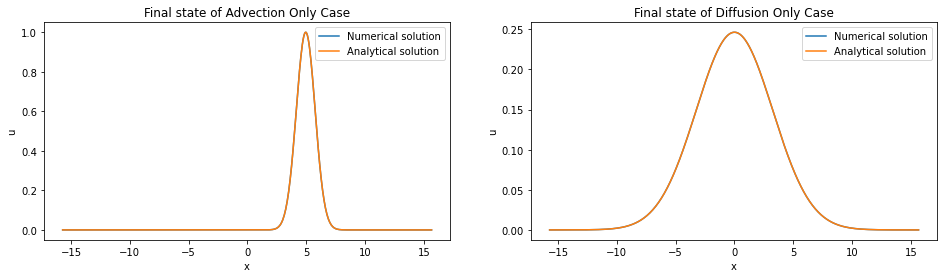

In [20]:
# Plot their final state
fig,axes = plt.subplots(1,2,figsize=(16,4))
axes[0].plot(x_gauss,numerical_sol_ao.y[:,-1],label = 'Numerical solution')
axes[0].plot(x_gauss,analytical_sol_ao[:,-1],label = 'Analytical solution')
axes[0].set_title('Final state of Advection Only Case')
axes[1].plot(x_gauss,numerical_sol_do.y[:,-1],label = 'Numerical solution')
axes[1].plot(x_gauss,analytical_sol_do[:,-1],label = 'Analytical solution')
axes[1].set_title('Final state of Diffusion Only Case')

for i in [0,1]:
    axes[i].set_xlabel('x')
    axes[i].set_ylabel('u')
    axes[i].legend()
plt.show()

Write them into a test function:

In [13]:
def test_solve_dudt(D,v,tol):
    # Use the Gaussian Equation to test the solutions
    grid = pde.create_grid(10*np.pi,512)
    x = grid.x
    t = pde.time_domain(10,0.1)    # Time domain
    
    # Initial condition, σ is the width of the Gaussian curve initially
    def gaussian_solution(t, x, σ, D):
        return σ / np.sqrt(σ**2 + 2*D*t) * np.exp(-x**2 / (2*(σ**2 + 2*D*t)))
    u0 = gaussian_solution(t[0],x,0.8,D)

    
    # Numerical solution for advection equation
    numerical_sol  = integrate.solve_ivp(pde.adv_diff_eq,[t[0],t[-1]],u0,args=(grid,D,v),t_eval=t,method='DOP853')
    numerical_sol_f = numerical_sol.y[:,-1]
    
    # Analytical solution for advection equation: u(x,t) = u0(x - v*t)
    analytical_sol = np.zeros((len(x),len(t)))
    for i in range(len(t)):
        analytical_sol[:,i] = gaussian_solution(t[i],x - v*t[i],0.8,D)
    analytical_sol_f = analytical_sol[:,-1]
    
    mean_error = np.mean(np.abs(numerical_sol_f - analytical_sol_f))
    print(mean_error)
    return mean_error < tol

tol = 1e-6
# Case 1: Constant advection only, no diffusion
assert test_solve_dudt(0,0.5,tol)
# Case 2: Constant diffusion only, no advection
assert test_solve_dudt(0.5,0,tol)
print('All test passed.')

1.9705171436525708e-07
1.421784252808024e-07
All test passed.


### <span style="color:darkblue">Both Advection and Diffusion</span>
Find the signal $u = e^{-x^2}cos(x)$ after 10 seconds for $x \in [-16,16]$ when the wave is simply advecting and diffusing based on the advection-diffusion equation. The advection velocity equals to 0.6 and diffusion rate equals to 0.3.

In [22]:
# Define the time domain with t_final = 10 and dt = 0.1 (a random pick)
t_both = pde.time_domain(10, 0.1)

# Define the spatial domain using the grid class
grid_both = pde.create_grid(32,512)
x_both = grid_both.x

# Define initial condition
u0_both = 1/np.cosh(x_both)**2

# Define the values for coefficients
D_both = 0.3        # diffusion rate
v_both = 0.6        # advection velocity

In [15]:
u_both = integrate.solve_ivp(pde.adv_diff_eq,[t_both[0],t_both[-1]],u0_both,args=(grid_both,D_both,v_both),t_eval = t_both,method = 'DOP853')

In [16]:
pde.plot_anim(t_both,grid_both,u0_both,u_both)

### <span style="color:darkblue">Burger's Equation</span>
Now, domains no change, but the wave is travelling based on the Burger's equation

In [17]:
u_bur = integrate.solve_ivp(pde.burger_eq,[t_both[0],t_both[-1]],u0_both,args=(grid_both,D_both),t_eval = t_both,method = 'DOP853')
pde.plot_anim(t_both,grid_both,u0_both,u_bur)

In [23]:
# Almost no diffusion
D_bur = 0.02
u_bur = integrate.solve_ivp(pde.burger_eq,[t_both[0],t_both[-1]],u0_both,args=(grid_both,D_bur),t_eval = t_both,method = 'DOP853')
pde.plot_anim(t_both,grid_both,u0_both,u_bur)

In [24]:
# Initial condition easy to break
u0_bur = -np.sin(2*np.pi*x_both/32)
u_bur = integrate.solve_ivp(pde.burger_eq,[t_both[0],t_both[-1]],u0_bur,args=(grid_both,D_bur),t_eval = t_both,method = 'DOP853')
pde.plot_anim(t_both,grid_both,u0_bur,u_bur)

### <span style="color:darkblue">A New PDE</span>
With the PDEsolver, we could solve many different PDEs as long as they are one-dimensional first-order PDEs with periodic boundary conditions.  
Here, we randomly define a new PDE and we try to solve the solution of the PDE after 10 seconds for $x \in [-32,32]$:
<font size= "3">$$\frac{\partial u}{\partial t} = 0.07\frac{\partial^3 u}{\partial x^3} + 1.5\frac{\partial u}{\partial x}$$</font>
where initial condition is $u_0 = e^{-x^2}$

In [25]:
# Spatial and Temporal domains are the same as above
# Define Initial conditions
grid_new = pde.create_grid(64,1024)
x_new = grid_new.x
u0_new = np.exp(-x_new**2)

# Define the new PDE using the pseudo-spectral method
def new_PDE(t,u,grid):
    '''
    This is a randomly produced new PDE with no specific meaning but to test the usefulness of the PDEsolver package.
    '''
    d_u = pde.derivative(grid,u,1)
    ddd_u = pde.derivative(grid,u,3)
    
    du_dt = 0.07*ddd_u + 1.5*d_u
    
    return du_dt

In [ ]:
# Solve the new PDE
u_new = integrate.solve_ivp(new_PDE,[t_both[0],t_both[-1]],u0_new,args=(grid_new,),t_eval = t_both, method = 'DOP853')
pde.plot_anim(t_both,grid_new,u0_new,u_new)

-----
## Validation and Comparison
### <span style="color:darkblue">Test functions</span>

In [ ]:
def test_grid(tol):
    # Test using x = [-2pi,-3pi/2,-pi,-pi/2,0,pi/2,pi,3pi/2]
    l = 4*np.pi
    n = 8
    grid = pde.create_grid(l,n)
    
    true_x = np.array([-2*np.pi,-3*np.pi/2,-np.pi,-np.pi/2,0,np.pi/2,np.pi,3*np.pi/2])
    calc_x = grid.x
    test_phys_domain = sum(np.abs(true_x - calc_x)) < tol
    
    true_wavenum = 2*np.pi*np.array([0,1,2,3,-4,-3,-2,-1])/(8*np.pi/2)
    calc_wavenum = grid.wavenum
    test_four_domain = sum(np.abs(true_wavenum - calc_wavenum)) < tol
    
    return (test_phys_domain and test_four_domain).all()

t = 1e-12
assert test_grid(t)

In [ ]:
def test_derivative(tol):
    # Test using f = sin(2x) for x in -2pi to 2pi
    grid = pde.create_grid(4*np.pi,100)
    x = grid.x
    f = np.sin(2*x)
    true_df = -4*f
    calc_df = pde.derivative(grid,f,2)
    return sum(np.abs(calc_df - true_df)) < tol

t = 1e-10
assert test_derivative(t)

### <span style="color:darkblue">Error</span>
We will test how error change with the choice of x using the Advection-diffusion equation with initial condition equals to the Gaussian function. Error is being calculated as the mean error at $t_{final}$. Three cases being tested are the advection only ($v = 0.5$), diffusion only ($D = 0.5$), and both advection and diffusion ($v = 0.5, D = 0.5$).

In [ ]:
def error(num_v,D,v):
    error_array = []
    
    for i in range(1,num_v):
        grid_v = pde.create_grid(10*np.pi,2**i)
        x_v = grid_v.x
        u0_v = gaussian_solution(0,x_v,0.8,0)
        numerical_sol = integrate.solve_ivp(pde.adv_diff_eq,[t_gauss[0],t_gauss[-1]],u0_v,args=(grid_v,D,v),t_eval=t_gauss,method='DOP853')

        numerical_f = numerical_sol.y[:,-1]
        analytical_f = analytical_sol(x_v,t_gauss,D,v)[:,-1]
    
        mean_error = np.abs(numerical_f - analytical_f).mean()
        error_array.append(mean_error)
    
    return error_array

In [ ]:
error_do = error(11,D_do,v_do)
error_ao = error(11,D_ao,v_ao)
error_both = error(11,D_do,v_ao)

In [ ]:
plt.figure(figsize = (8,6))
plt.plot(2**np.arange(1,11),error_do,label='Advection Only')
plt.plot(2**np.arange(1,11),error_ao,label='Diffusion Only')
plt.plot(2**np.arange(1,11),error_both,label='Advection and Diffusion')
plt.xscale('log',base=2)
plt.yscale('log')
plt.title('Error changes with grid resolution')
plt.xlabel('Number of Points in x')
plt.ylabel('Error')
plt.legend()
plt.show()

-----
## Conclusion and Future Investigation
- we use the **pseudo-spectral method** to create a PDE solver for any one-dimensional first order PDE
- test functions, plots, error calculations, and examples are demonstrated for the package
- This method can be further extend into multi-dimensional higher order PDEs